In [1]:
using Revise
using WaterControl
using Plots

# Solve a 2D system forward in time

In [5]:
nx = 100
ny = 100
target = ones(nx * ny)

prob = ShallowWaterProblem2D(
    target,
    tspan=(0., 20.)
)

max_time = prob.tspan[2]
acc_times = LinRange(0, max_time, 10)
x_acc = 0.25 * sin.(2acc_times[1:end-1] * 2pi / 10.)
y_acc = 0.25 * cos.(2acc_times[1:end-1] * 2pi / 10.)

acc = DiscreteAcceleration2D(
    x_acc,
    y_acc,
    acc_times,
)

sol = solve_forward(prob, acc);

┌ Info: Saved animation to /var/folders/ds/t6zgkw3n75d3gzz89xmkcncm0000gn/T/jl_CB4VKhSLcd.gif
└ @ Plots /Users/alexrubin/.julia/packages/Plots/Ec1L1/src/animation.jl:156


Plots.AnimatedGif("/var/folders/ds/t6zgkw3n75d3gzz89xmkcncm0000gn/T/jl_CB4VKhSLcd.gif")
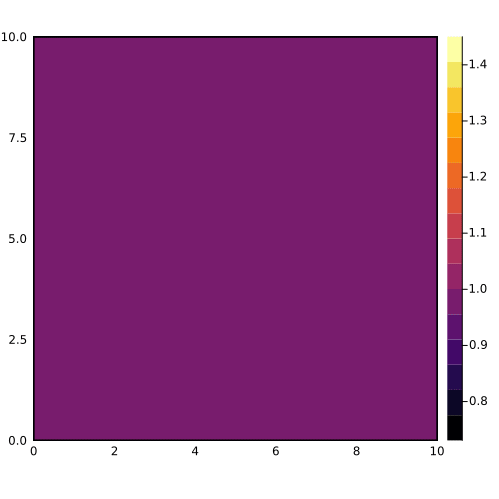

In [6]:
create_contour_animation(sol, prob)

┌ Info: Saved animation to /var/folders/ds/t6zgkw3n75d3gzz89xmkcncm0000gn/T/jl_6bKnYH6Nyd.gif
└ @ Plots /Users/alexrubin/.julia/packages/Plots/Ec1L1/src/animation.jl:156


Plots.AnimatedGif("/var/folders/ds/t6zgkw3n75d3gzz89xmkcncm0000gn/T/jl_6bKnYH6Nyd.gif")
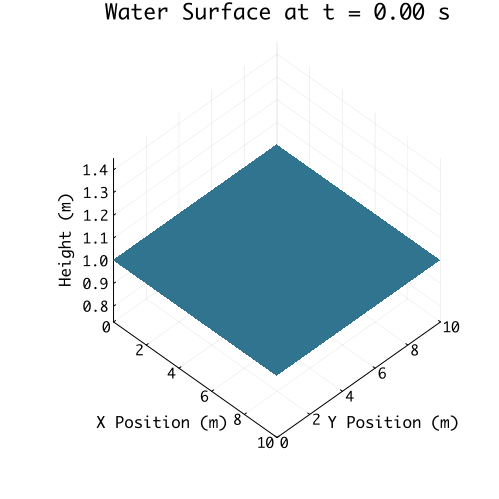

In [7]:
create_surface_animation(sol, prob)

# Optimize 2D

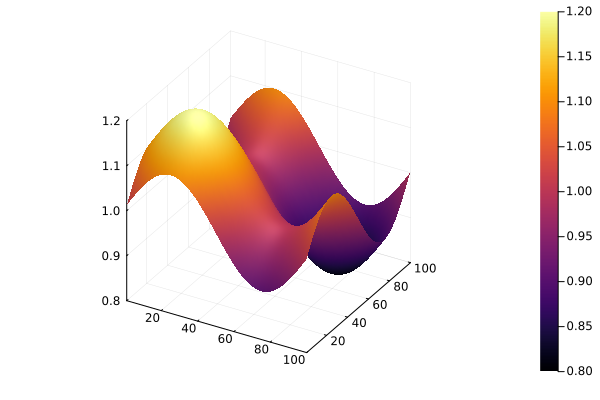

In [8]:
x = 1:100
y = 1:100
X = repeat(x', length(y))
Y = repeat(y, 1, length(x))
Z = 1 .+ 0.1*sin.(2X * pi / 100) .+ 0.1*sin.(2Y * pi / 100)

surface(x, y, Z)

In [12]:
target = vec(Z)
prob = ShallowWaterProblem2D(
    target,
    tspan=(0., 20.)
)
acc = optimize(prob)

Objective: 50.00000000000001
Objective: 40.06858110402095
Objective: 15.320674384939085
Objective: 15.11342235314214
Objective: 13.565567476950859
Objective: 12.47185899526869
Objective: 11.89030501285706
Objective: 11.388108174933118
Objective: 10.230440168155042
Objective: 10.051599771319578
Objective: 9.382697573359867
Objective: 8.824708220978595
Objective: 8.668422291630893
Objective: 7.64258711956264
Objective: 7.111183862404692
Objective: 6.596563532061724
Objective: 6.316060843118802
Objective: 6.011947715265407
Objective: 5.534624876350934
Objective: 5.374213493603835
Objective: 5.078125885434462
Objective: 4.794247804198065
Objective: 4.732923778829865
Objective: 4.212410785135453
Objective: 3.949761765579903
Objective: 3.677516767113741
Objective: 3.526664586964224
Objective: 3.387910003819656
Objective: 3.1175385705402423
Objective: 3.0922461916441923
Objective: 2.939281336518821
Objective: 2.8079460203802733
Objective: 2.4915535258292323
Objective: 2.4542652386820043
Objec

DiscreteAcceleration2D([0.027887990926204316, 0.011554112946911636, -0.003915390905407603, -0.019414069833509098, -0.03224394781677389, -0.04495598418897847, -0.04227668629596175, -0.037898329610001176, -0.028099162998285028, -0.013782737247450199  …  0.08827978465890268, 0.051819577323599285, -0.07568453701366772, -0.10697867151732544, 0.07738192572253887, 0.21508723882506653, 0.19059198625967827, 0.010619594000290495, -0.43889150880035704, -0.6374688610168836], [0.027871316854978716, 0.011548363144675639, -0.003911177675053862, -0.01940014181518119, -0.03222188925415295, -0.04492553609367506, -0.042248338218606754, -0.03787367162346638, -0.028082075193508176, -0.01377584582658678  …  0.08831337635346405, 0.05183193858834966, -0.07569597809492948, -0.10701339398080943, 0.07732048044887946, 0.21501903512150408, 0.1905228244154826, 0.010561272941033102, -0.43893062342044015, -0.6374839190864416], [0.0, 0.4, 0.8, 1.2, 1.6, 2.0, 2.4, 2.8000000000000003, 3.2, 3.5999999999999996  …  16.4, 1

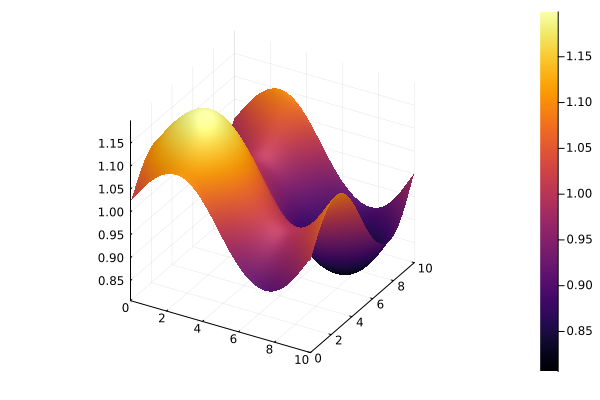

In [14]:
sol = solve_forward(prob, acc)

surface(
    prob.x,
    prob.y,
    reshape(sol.u[end][1:prob.nx*prob.ny], prob.nx, prob.ny),
)

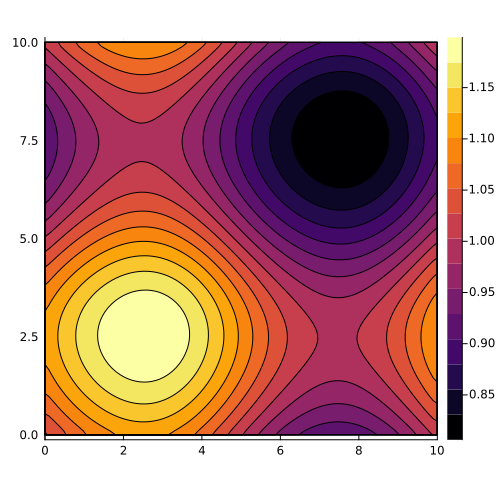

In [25]:
contour(
    prob.x,
    prob.y,
    reshape(sol.u[end][1:prob.nx*prob.ny], prob.nx, prob.ny),
    zlim=(0.8, 1.2),
    fill=true,
    aspect_ratio=:equal,
    size=(500,500)
)

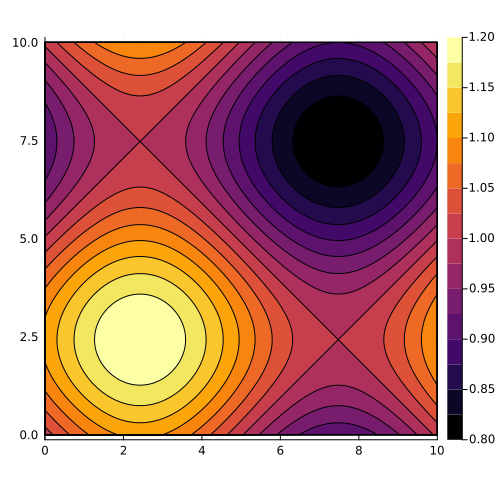

In [26]:
contour(prob.x, prob.y, Z,     zlim=(0.8, 1.2), fill=true,
aspect_ratio=:equal,
size=(500,500))

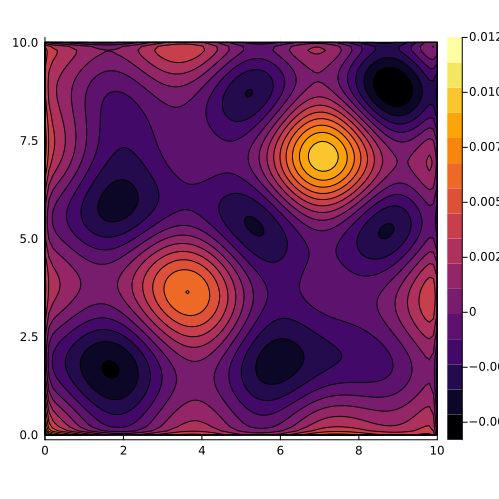

In [24]:
contour(
    prob.x,
    prob.y,
    reshape((sol.u[end][1:prob.nx*prob.ny] - target) ./ target, prob.nx, prob.ny),
    zlim=(0.8, 1.2),
    fill=true,
    aspect_ratio=:equal,
    size=(500,500)
)